<a href="https://colab.research.google.com/github/GuptPrana/DIP_FinalProject-/blob/main/medianfilter.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

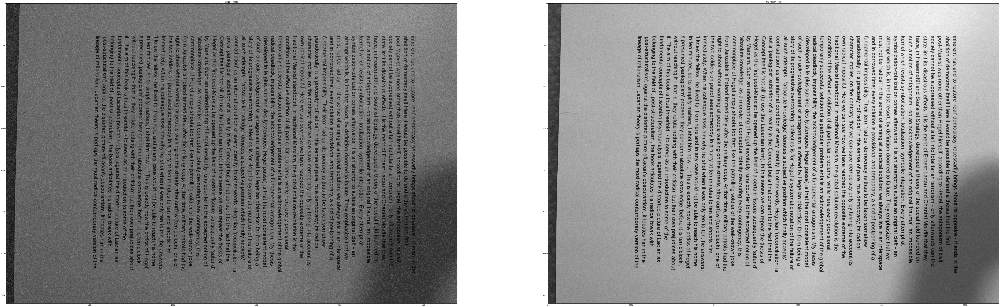

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2

def median_filter(data, kernel_size):
    temp = []
    indexer = kernel_size // 2
    data_final = []
    data_final = np.zeros((len(data),len(data[0])))
    for i in range(len(data)):

       for j in range(len(data[0])):

            for z in range(kernel_size):
                if i + z - indexer < 0 or i + z - indexer > len(data) - 1:
                    for c in range(kernel_size):
                        temp.append(0)
                else:
                    if j + z - indexer < 0 or j + indexer > len(data[0]) - 1:
                        temp.append(0)
                    else:
                        for k in range(kernel_size):
                            temp.append(data[i + z - indexer][j + k - indexer])

            temp.sort()
            data_final[i][j] = temp[len(temp) // 2]
            temp = []
    return data_final

if __name__ == '__main__':
    # Load image and convert it to gray scale
    file_name = cv2.imread('D85_5833.jpg')
    	
    gray = cv2.cvtColor(file_name, cv2.COLOR_BGR2GRAY)

    # Add Gaussian noise
    #noisy_img = add_gaussian_noise(img, 30)

    # Apply Median Filter
    removed_noise_3 = median_filter(gray, 5)
    #removed_noise_5 = median_filter(img, 5)

    # Display results
    fig = plt.figure(figsize = (120, 100))
    display = [gray,  removed_noise_3]
    title = ['Original Image',  '3x3 Median Filter']

    for i in range(len(display)):
        fig.add_subplot(2, 2, i+1)
        plt.imshow(display[i], cmap = 'gray')
        plt.title(title[i])
    
    plt.show()